In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
from helpers import get_charts, get_countries_charts, get_track_data

In [3]:
tracks = get_track_data()
global_charts = get_charts()
countries_charts = get_countries_charts()

In [4]:
from helpers.model import get_basic_track_features

track_feats = get_basic_track_features()

In [5]:
def compute_popularity_metrics(track):
    """
    Computes popularity metrics for a Spotify track, using its rank history (caution: needs to be sorted).

    Metrics have been adapted from "Music Popularity: Metrics, Characteristics, and Audio-Based Prediction" by Lee and Lee (https://arxiv.org/abs/1812.00551)

    Only added metric is number of total streams
    """
    ranks = track["rank"]
    scores = 50 - ranks + 1
    debut = scores.iloc[0]
    peak = scores.max()
    average = scores.mean()
    score_std = scores.std()
    length = scores.shape[0]
    total = scores.sum()
    skew = scores.skew()
    kurtosis = scores.kurtosis()
    return pd.Series(
        {
            "debut_score": debut,
            "peak_score": peak,
            "average_score": average,
            "rank_std_score": score_std,
            "length_score": length,
            "sum_score": total,
            "skewness_score": skew,
            "kurtosis_score": kurtosis,
            "total_streams": track["streams"].sum(),
        }
    )




In [6]:
global_track_metrics = global_charts.sort_values(by="date").groupby("id").apply(compute_popularity_metrics)
global_track_metrics

,debut_score,peak_score,average_score,rank_std_score,length_score,sum_score,skewness_score,kurtosis_score,total_streams
id,,,,,,,,,
000RW47rhEkSqjgTrZx7YX,37.0,37.0,20.166667,12.499593,42.0,847.0,-0.424222,-1.431618,16314953.0
000xQL6tZNLJzIrtIgxqSl,1.0,33.0,12.088193,7.777216,703.0,8498.0,0.563509,-0.520212,44812437.0
000xYdQfIZ4pDmBGzQalKU,33.0,37.0,24.065574,7.236180,61.0,1468.0,-0.497529,0.017994,7591184.0
001b8t3bYPfnabpjpfG1Y4,19.0,19.0,19.000000,NaN,1.0,19.0,NaN,NaN,94166.0
003VDDA7J3Xb2ZFlNx7nIZ,20.0,20.0,12.500000,10.606602,2.0,25.0,NaN,NaN,1091626.0
...,...,...,...,...,...,...,...,...,...
7zxphfIdUMOfZOAVpKFlld,12.0,45.0,32.800000,12.911235,5.0,164.0,-1.281743,1.626970,362094.0
7zyYmIdjqqiX6kLryb7QBx,1.0,19.0,5.891304,4.724538,46.0,271.0,1.115291,0.510834,416779.0
7zyZ9yPXIQebb79PrMghpV,21.0,21.0,21.000000,NaN,1.0,21.0,NaN,NaN,440539.0


In [7]:
tracks[["name", "artist_name_1"]].join(global_track_metrics, on="id", how="right")

,name,artist_name_1,debut_score,peak_score,average_score,rank_std_score,length_score,sum_score,skewness_score,kurtosis_score,total_streams
id,,,,,,,,,,,
000RW47rhEkSqjgTrZx7YX,Lance Individual,Jorge & Mateus,37.0,37.0,20.166667,12.499593,42.0,847.0,-0.424222,-1.431618,16314953.0
000xQL6tZNLJzIrtIgxqSl,Still Got Time (feat. PARTYNEXTDOOR),ZAYN,1.0,33.0,12.088193,7.777216,703.0,8498.0,0.563509,-0.520212,44812437.0
000xYdQfIZ4pDmBGzQalKU,"Eu, Você, O Mar e Ela",Luan Santana,33.0,37.0,24.065574,7.236180,61.0,1468.0,-0.497529,0.017994,7591184.0
001b8t3bYPfnabpjpfG1Y4,Geen Stof,Josylvio,19.0,19.0,19.000000,NaN,1.0,19.0,NaN,NaN,94166.0
003VDDA7J3Xb2ZFlNx7nIZ,YELL OH,Trippie Redd,20.0,20.0,12.500000,10.606602,2.0,25.0,NaN,NaN,1091626.0
...,...,...,...,...,...,...,...,...,...,...,...
7zxphfIdUMOfZOAVpKFlld,Trapper Of The Year (Intro),23,12.0,45.0,32.800000,12.911235,5.0,164.0,-1.281743,1.626970,362094.0
7zyYmIdjqqiX6kLryb7QBx,以後別做朋友,Eric Chou,1.0,19.0,5.891304,4.724538,46.0,271.0,1.115291,0.510834,416779.0
7zyZ9yPXIQebb79PrMghpV,Zap Zum,Pabllo Vittar,21.0,21.0,21.000000,NaN,1.0,21.0,NaN,NaN,440539.0


In [8]:
global_track_metrics.describe()

,debut_score,peak_score,average_score,rank_std_score,length_score,sum_score,skewness_score,kurtosis_score,total_streams
count,33881.000000,33881.000000,33881.000000,28275.000000,33881.000000,33881.000000,26102.000000,24778.000000,3.388100e+04
mean,21.337505,30.164842,17.952489,9.683931,134.701337,3435.035949,0.025560,-0.160883,1.626203e+07
std,15.606750,14.823366,9.826281,4.225331,591.290505,17144.612732,0.879453,2.554461,9.200197e+07
min,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000,-10.282525,-6.000000,1.078000e+03
25%,7.000000,18.000000,10.409639,6.623322,3.000000,35.000000,-0.460034,-1.211086,1.225270e+05
50%,19.000000,32.000000,17.307692,10.062101,13.000000,209.000000,0.001263,-0.789437,6.852820e+05
75%,35.000000,43.000000,24.375000,12.838720,62.000000,1270.000000,0.510101,0.141697,4.195401e+06
max,50.000000,50.000000,50.000000,33.941125,23267.000000,757193.000000,4.412736,129.052966,3.634759e+09


In [9]:
metrics = global_track_metrics.columns.tolist()
features = track_feats.columns.tolist()
metrics_and_features = global_track_metrics.join(track_feats, on="id", how="left")
metrics_and_features

,debut_score,peak_score,average_score,rank_std_score,length_score,sum_score,skewness_score,kurtosis_score,total_streams,explicit,...,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,single_release
id,,,,,,,,,,,,,,,,,,,,,
000RW47rhEkSqjgTrZx7YX,37.0,37.0,20.166667,12.499593,42.0,847.0,-0.424222,-1.431618,16314953.0,False,...,1.0,0.0509,0.30900,0.000000,0.0750,0.962,117.399,164459.0,4.0,False
000xQL6tZNLJzIrtIgxqSl,1.0,33.0,12.088193,7.777216,703.0,8498.0,0.563509,-0.520212,44812437.0,False,...,1.0,0.0639,0.13100,0.000000,0.0852,0.524,120.963,188491.0,4.0,True
000xYdQfIZ4pDmBGzQalKU,33.0,37.0,24.065574,7.236180,61.0,1468.0,-0.497529,0.017994,7591184.0,False,...,1.0,0.0400,0.68400,0.000539,0.4630,0.651,166.018,187119.0,4.0,False
001b8t3bYPfnabpjpfG1Y4,19.0,19.0,19.000000,NaN,1.0,19.0,NaN,NaN,94166.0,True,...,1.0,0.3720,0.10500,0.000000,0.1170,0.541,95.951,167866.0,4.0,False
003VDDA7J3Xb2ZFlNx7nIZ,20.0,20.0,12.500000,10.606602,2.0,25.0,NaN,NaN,1091626.0,True,...,0.0,0.1380,0.00419,0.000000,0.2280,0.190,74.496,236779.0,4.0,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7zxphfIdUMOfZOAVpKFlld,12.0,45.0,32.800000,12.911235,5.0,164.0,-1.281743,1.626970,362094.0,True,...,0.0,0.3160,0.00582,0.013500,0.0827,0.461,121.913,110164.0,4.0,True
7zyYmIdjqqiX6kLryb7QBx,1.0,19.0,5.891304,4.724538,46.0,271.0,1.115291,0.510834,416779.0,False,...,1.0,0.0372,0.72800,0.000000,0.1050,0.291,130.576,260573.0,4.0,False
7zyZ9yPXIQebb79PrMghpV,21.0,21.0,21.000000,NaN,1.0,21.0,NaN,NaN,440539.0,False,...,1.0,0.0400,0.08580,0.000000,0.1580,0.833,169.123,167503.0,4.0,False


In [10]:
len(metrics)

9

In [11]:
metrics_and_features.columns

Index(['debut_score', 'peak_score', 'average_score', 'rank_std_score',
       'length_score', 'sum_score', 'skewness_score', 'kurtosis_score',
       'total_streams', 'explicit', 'danceability', 'energy', 'key',
       'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness',
       'liveness', 'valence', 'tempo', 'duration_ms', 'time_signature',
       'single_release'],
      dtype='object')

<AxesSubplot: xlabel='explicit', ylabel='debut_score'>

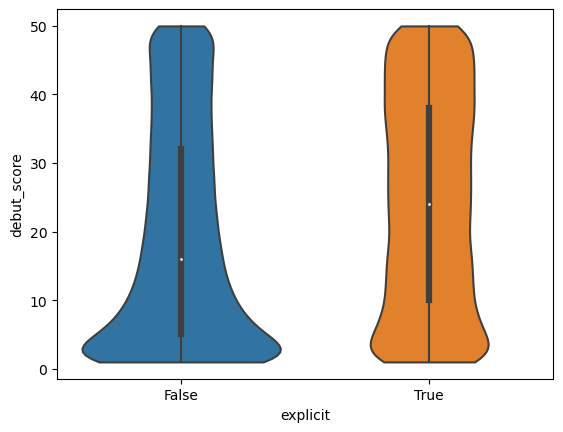

In [12]:
sns.violinplot(data=metrics_and_features, x="explicit", y="debut_score", alpha=0.05, cut=0)

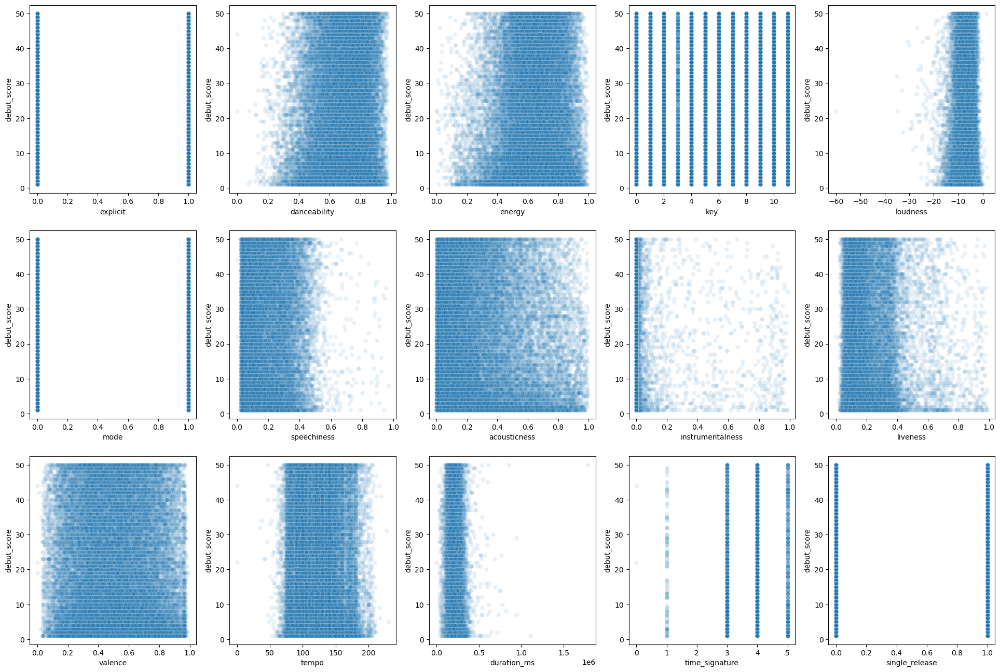

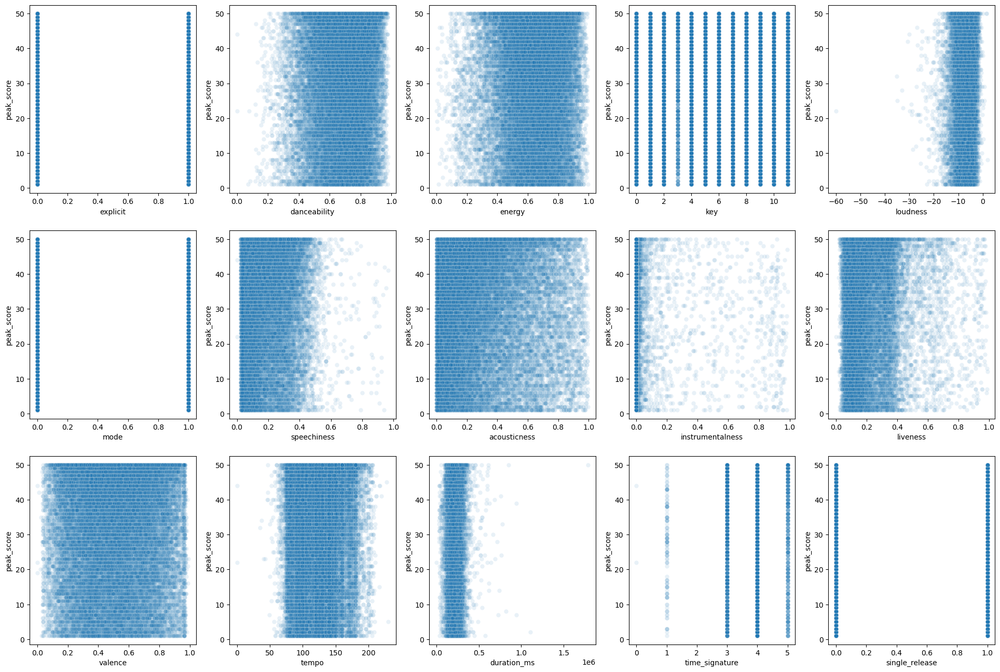

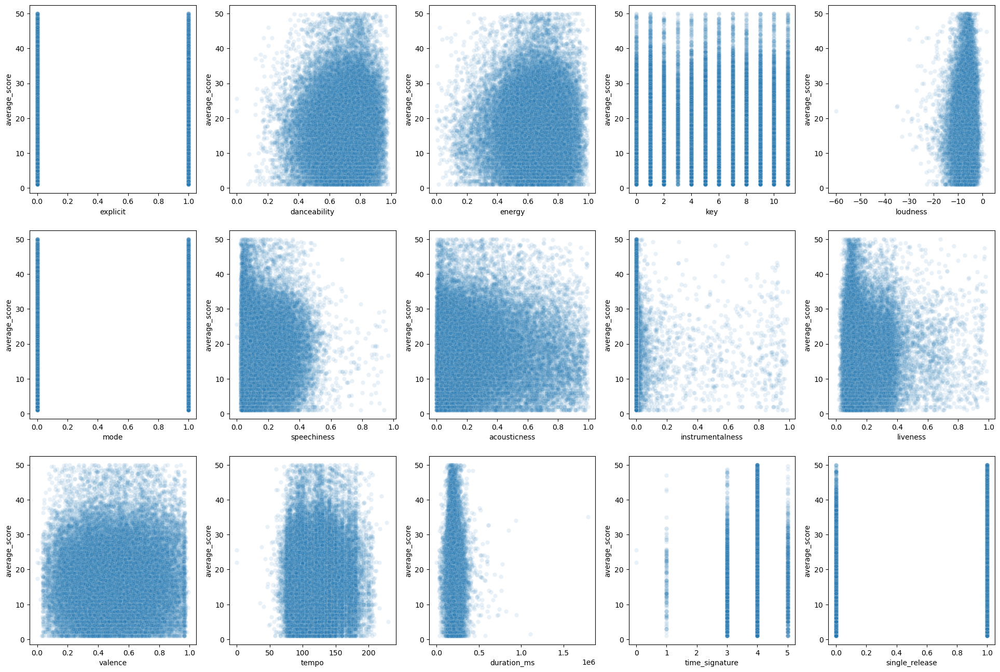

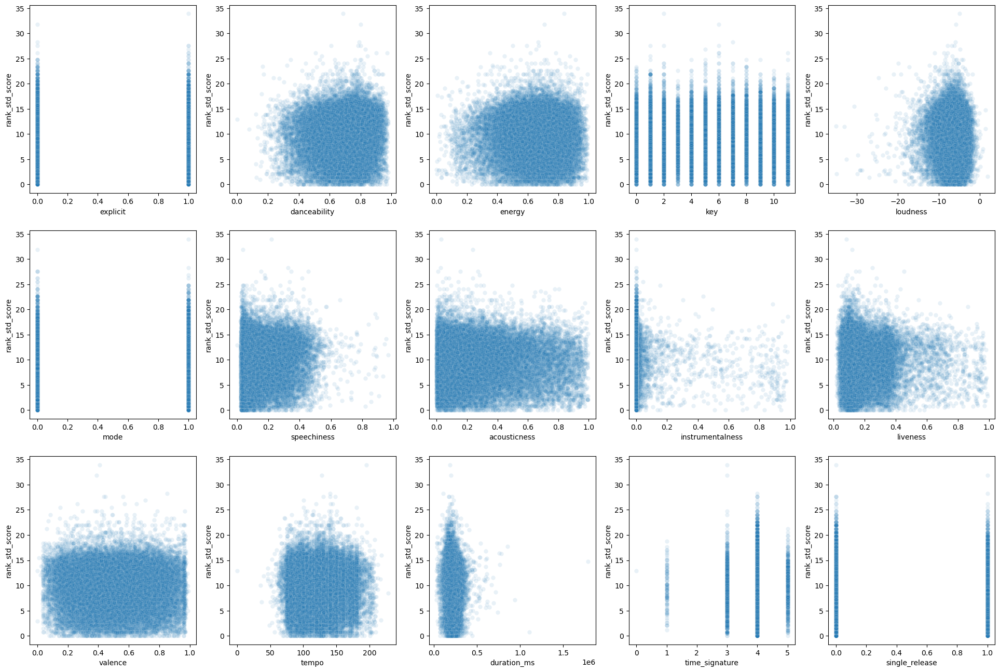

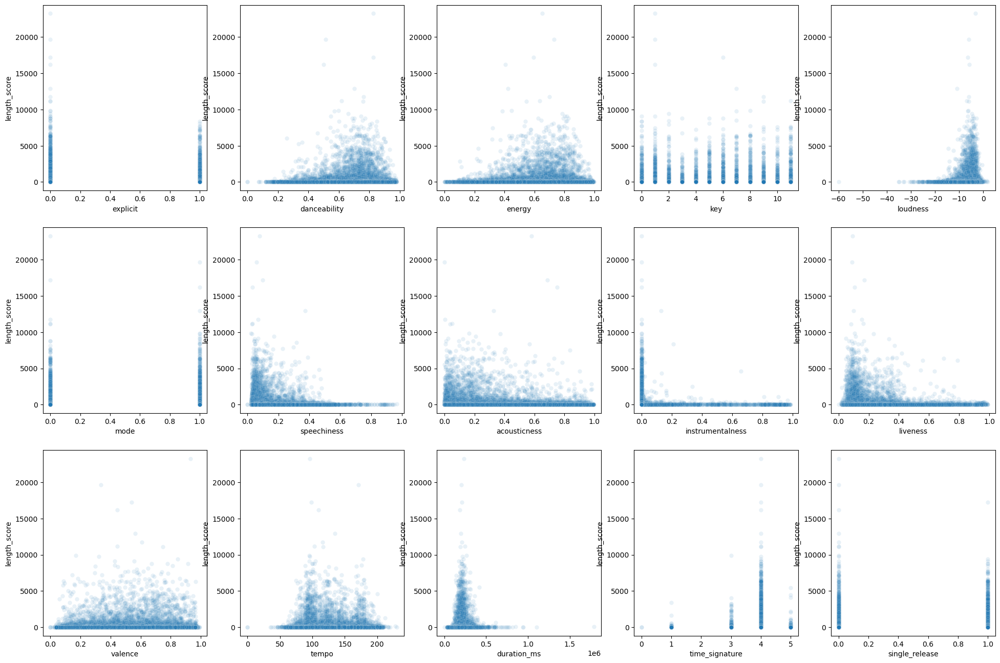

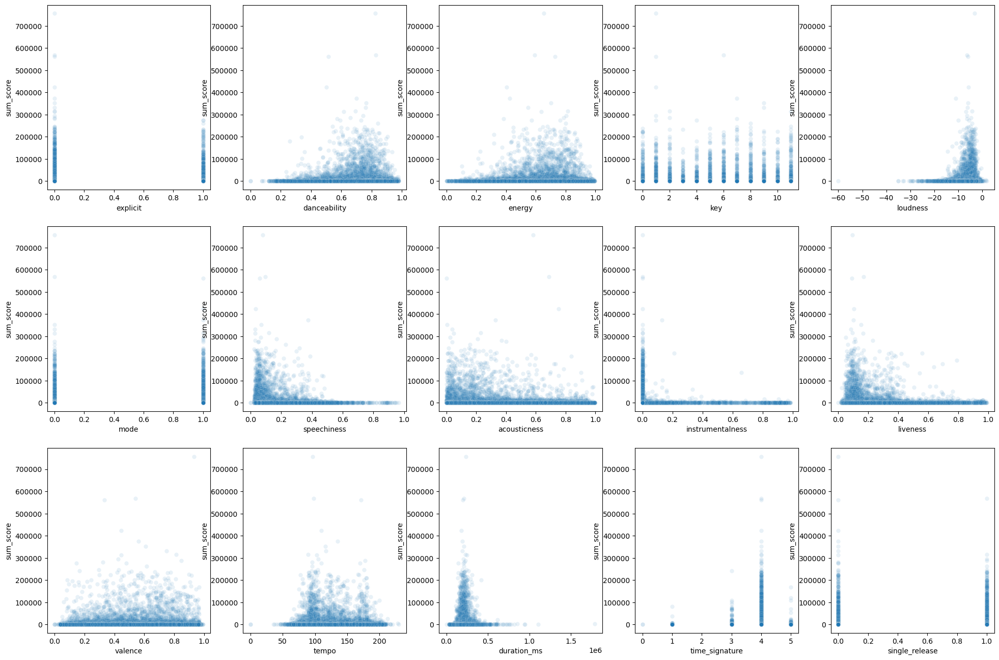

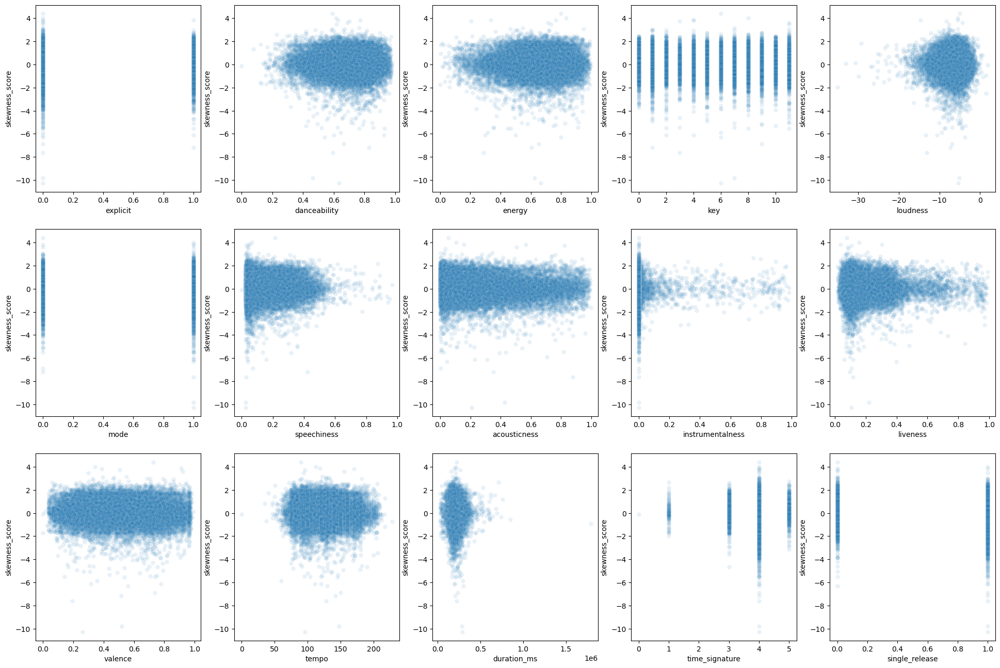

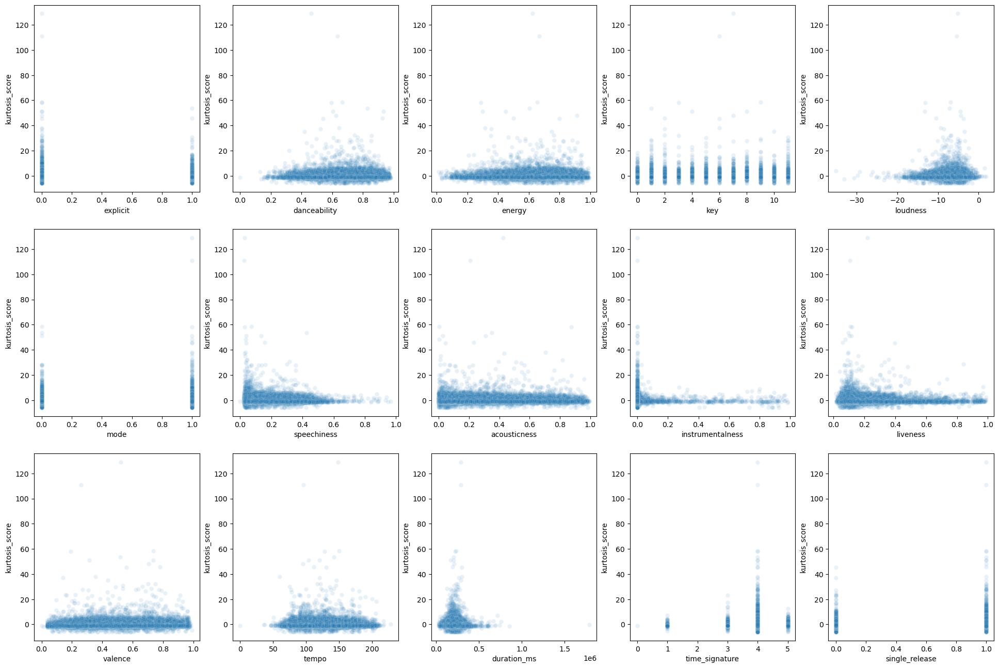

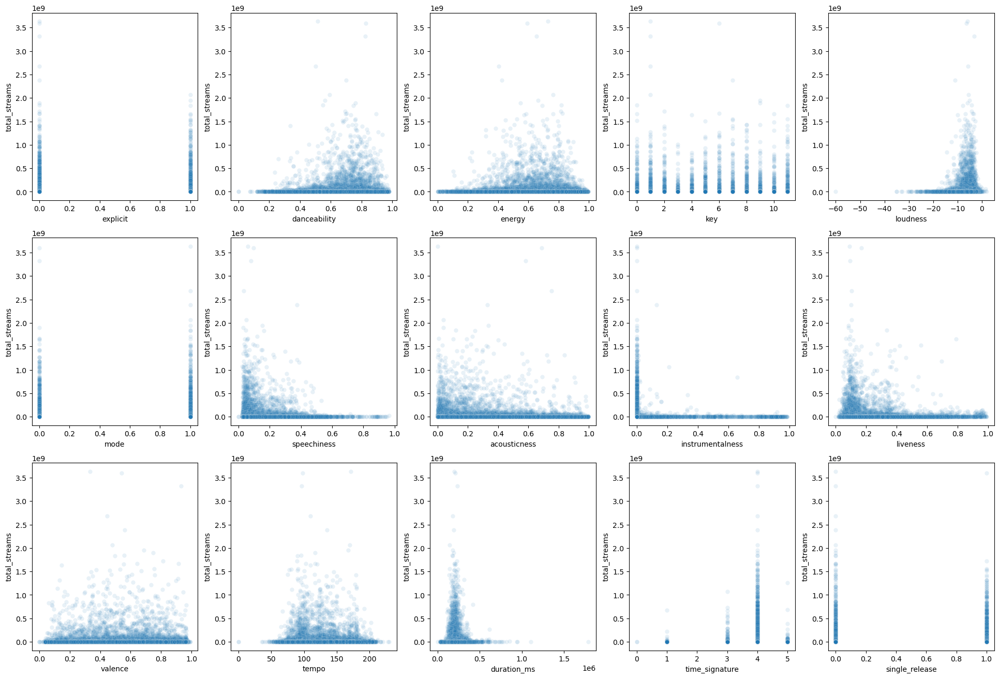

In [13]:
def plot_metric_against_features(metrics_and_features, metric, features):
    fig, axs = plt.subplots(3, 5, figsize=(24, 16))
    axs = axs.ravel()

    for i, feature in enumerate(features):
        sns.scatterplot(metrics_and_features, x=feature, y=metric, ax=axs[i], alpha=0.1)

for metric in metrics:
    plot_metric_against_features(metrics_and_features, metric, features)
plt.show()

In [14]:
metrics_and_features.isna().sum()

debut_score            0
peak_score             0
average_score          0
rank_std_score      5606
length_score           0
sum_score              0
skewness_score      7779
kurtosis_score      9103
total_streams          0
explicit               5
danceability           5
energy                 5
key                    5
loudness               5
mode                   5
speechiness            5
acousticness           5
instrumentalness       5
liveness               5
valence                5
tempo                  5
duration_ms            5
time_signature         5
single_release         5
dtype: int64

## Regression attempt

In [16]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

for metric in metrics:
  df = metrics_and_features[~metrics_and_features[metric].isna()].dropna()
  X = df.drop(columns=metrics)
  y = df[metric]
  X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=2022, test_size=0.25)
  reg = LinearRegression().fit(X_train, y_train)
  print(f"R2 score on test set for {metric} is {reg.score(X_test, y_test)}")


R2 score on test set for debut_score is 0.07313138491356974
R2 score on test set for peak_score is 0.0088517133217062
R2 score on test set for average_score is 0.014920678250332053
R2 score on test set for rank_std_score is 0.024898178484179967
R2 score on test set for length_score is 0.017608711527107967
R2 score on test set for sum_score is 0.014821431082879921
R2 score on test set for skewness_score is 0.016719896305060322
R2 score on test set for kurtosis_score is 0.0027204830227395282
R2 score on test set for total_streams is 0.009331270870932107


Phew, that's horrific lol.

The [documentation of the `score()` method]() states that the score we get back is in fact $R^2$.
> The best possible score is 1.0 and it can be negative (because the model can be arbitrarily worse). A constant model that always predicts the expected value of y, disregarding the input features, would get a  score of 0.0.

So, we know that linear regression doesn't work *at all* in our case.